In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns

# On fixe la graine
random.seed(42)

In [3]:
data=pd.read_csv("data_seed2.txt", sep="\t", decimal=",", dtype="object")
data.columns = data.columns.str.lower()
data.head()

,datdelhis_mm0,numtecprs,sldcrdmms_sum_mm1,engagement_sum_mm1,top_pret_conso_mm1,nbr_pret_conso_mm1,sldcrdmms_sum_mm2,engagement_sum_mm2,top_pret_conso_mm2,nbr_pret_conso_mm2,...,crtad_ag_solde_t1,crtad_ag_solde_t2,encours_par,crtad_ag_nbjde_bb,crtad_ag_nbjde_ba,crtad_ag_nbjde_bc,topcptlitig,somme_encours,cible,rnd_1_20
0,202 410,9 201 003 869,"0,00","800,00","0,00","0,00","0,00","800,00","0,00","0,00",...,"-47 333,00","-13 333,00","0,00","92,00","262,00","5,00",0,"0,00",0,2
1,202 410,9 599 624 616,"1 152,00","200,00","0,00","0,00","1 755,00","200,00","0,00","0,00",...,"-3 333,00","-3 000,00","1 000,00","71,00","321,00","54,00",0,"1 000,00",0,2
2,202 412,1 413 515 491,"87 805,00","6 680,61","1,00","1,00","76 354,00","6 738,46","1,00","1,00",...,"220 333,00","146 666,00","157 084,00","0,00","13,00","0,00",0,"157 084,00",0,2
3,202 404,1 600 773 833,"2 468,00","200,00","0,00","0,00","2 534,00","200,00","0,00","0,00",...,"3 666,00","8 333,00","57 333,00","12,00","17,00","0,00",0,"57 333,00",0,2
4,202 409,2 661 466 041,"513 708,00","1 000,00","0,00","0,00","257 317,00","1 000,00","0,00","0,00",...,"370 333,00","210 666,00","0,00","9,00","247,00","60,00",0,"0,00",0,2


In [4]:
data_kaggle=pd.read_excel("data kaggle.xlsx")
data_kaggle.columns = data_kaggle.columns.str.lower()
data_kaggle.head()

,datdelhis_mm0,numtecprs,id,sldcrdmms_sum_mm1,engagement_sum_mm1,top_pret_conso_mm1,nbr_pret_conso_mm1,sldcrdmms_sum_mm2,engagement_sum_mm2,top_pret_conso_mm2,...,crtad_ag_solde_t,crtad_ag_solde_t1,crtad_ag_solde_t2,encours_par,crtad_ag_nbjde_bb,crtad_ag_nbjde_ba,crtad_ag_nbjde_bc,topcptlitig,somme_encours,rnd_1_20
0,202409,6099659558,202409@6099659558,63534,709.62,0,0,45557,500,0,...,88500,81166,83500,3257587,3,6,0,0,3257587,20
1,202405,599766044,202405@599766044,168649,800,0,0,187860,800,0,...,288500,234500,226000,37333,0,0,0,0,37333,20
2,202412,5125674890,202412@5125674890,9494,200,0,0,5852,200,0,...,14000,38666,29333,1428666,31,89,25,0,1428666,20
3,202401,2453995549,202401@2453995549,127272,18705.91,1,1,178180,18953.3,1,...,555333,1040666,1419333,44963,0,16,0,0,44963,20
4,202401,1166976276,202401@1166976276,38552,26454.7,1,1,27453,26774.11,1,...,109666,51666,13000,773332,0,26,16,0,773332,20


In [5]:
pip install openpyxl

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.0.1 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [6]:
def ajouter_mois_depuis_colonne(df, colonne):
    # Dictionnaire de correspondance chiffre → mois
    mois_map = {
        '01': 'Jan', '02': 'Fev', '03': 'Mars', '04': 'Avril',
        '05': 'Mai', '06': 'Juin', '07': 'Juil', '08': 'Août',
        '09': 'Sept', '10': 'Oct', '11': 'Nov', '12': 'Dec'
    }

    def extraire_mois(val):
        # Convertir en string et extraire les deux derniers chiffres
        deux_derniers = str(val)[-2:]
        # Retourner le mois si possible
        return mois_map.get(deux_derniers, None)
    months= df[colonne].apply(extraire_mois)
    return months

In [7]:
data["month"]=ajouter_mois_depuis_colonne(data, "datdelhis_mm0")
data.head()

,datdelhis_mm0,numtecprs,sldcrdmms_sum_mm1,engagement_sum_mm1,top_pret_conso_mm1,nbr_pret_conso_mm1,sldcrdmms_sum_mm2,engagement_sum_mm2,top_pret_conso_mm2,nbr_pret_conso_mm2,...,crtad_ag_solde_t2,encours_par,crtad_ag_nbjde_bb,crtad_ag_nbjde_ba,crtad_ag_nbjde_bc,topcptlitig,somme_encours,cible,rnd_1_20,month
0,202 410,9 201 003 869,"0,00","800,00","0,00","0,00","0,00","800,00","0,00","0,00",...,"-13 333,00","0,00","92,00","262,00","5,00",0,"0,00",0,2,Oct
1,202 410,9 599 624 616,"1 152,00","200,00","0,00","0,00","1 755,00","200,00","0,00","0,00",...,"-3 000,00","1 000,00","71,00","321,00","54,00",0,"1 000,00",0,2,Oct
2,202 412,1 413 515 491,"87 805,00","6 680,61","1,00","1,00","76 354,00","6 738,46","1,00","1,00",...,"146 666,00","157 084,00","0,00","13,00","0,00",0,"157 084,00",0,2,Dec
3,202 404,1 600 773 833,"2 468,00","200,00","0,00","0,00","2 534,00","200,00","0,00","0,00",...,"8 333,00","57 333,00","12,00","17,00","0,00",0,"57 333,00",0,2,Avril
4,202 409,2 661 466 041,"513 708,00","1 000,00","0,00","0,00","257 317,00","1 000,00","0,00","0,00",...,"210 666,00","0,00","9,00","247,00","60,00",0,"0,00",0,2,Sept


In [8]:
##présence de données manquantes
data.loc[[345,]]

,datdelhis_mm0,numtecprs,sldcrdmms_sum_mm1,engagement_sum_mm1,top_pret_conso_mm1,nbr_pret_conso_mm1,sldcrdmms_sum_mm2,engagement_sum_mm2,top_pret_conso_mm2,nbr_pret_conso_mm2,...,crtad_ag_solde_t2,encours_par,crtad_ag_nbjde_bb,crtad_ag_nbjde_ba,crtad_ag_nbjde_bc,topcptlitig,somme_encours,cible,rnd_1_20,month
345,202 410,5 510 074 447,"14 473,00","117 279,66","0,00","0,00","19 523,00","117 912,64","0,00","0,00",...,?,?,?,?,?,?,?,0,2,Oct


In [9]:
any(data.isna().sum())

False

In [10]:
data.dtypes

datdelhis_mm0         object
numtecprs             object
sldcrdmms_sum_mm1     object
engagement_sum_mm1    object
top_pret_conso_mm1    object
                       ...  
topcptlitig           object
somme_encours         object
cible                 object
rnd_1_20              object
month                 object
Length: 131, dtype: object

In [11]:
data_kaggle['nbr_pret_conso_mm1']

0        0
1        0
2        0
3        1
4        1
        ..
54661    0
54662    0
54663    0
54664    0
54665    0
Name: nbr_pret_conso_mm1, Length: 54666, dtype: object

In [12]:
data_kaggle.dtypes.value_counts()

object     94
int64      20
float64    16
Name: count, dtype: int64

In [13]:
def convert_if_numeric(col):
    if col.dtype == "object":
        # nettoyage
        cleaned = col.str.replace("\u202f", "")
        cleaned = cleaned.str.replace(",", ".")
    else:
        cleaned=col
    numeric_col = pd.to_numeric(cleaned, errors="coerce")
    if numeric_col.notna().any():
        return numeric_col
    return col

def convert_if_numeric2(col):
    numeric_col = pd.to_numeric(col, errors="coerce")
    if numeric_col.notna().any():
        return numeric_col
    return col
# Appliquer la fonction à toutes les colonnes
data = data.apply(convert_if_numeric)
data.head()

,datdelhis_mm0,numtecprs,sldcrdmms_sum_mm1,engagement_sum_mm1,top_pret_conso_mm1,nbr_pret_conso_mm1,sldcrdmms_sum_mm2,engagement_sum_mm2,top_pret_conso_mm2,nbr_pret_conso_mm2,...,crtad_ag_solde_t2,encours_par,crtad_ag_nbjde_bb,crtad_ag_nbjde_ba,crtad_ag_nbjde_bc,topcptlitig,somme_encours,cible,rnd_1_20,month
0,202410,9201003869,0.0,800.00,0.0,0.0,0.0,800.00,0.0,0.0,...,-13333.0,0.0,92.0,262.0,5.0,0.0,0.0,0,2,Oct
1,202410,9599624616,1152.0,200.00,0.0,0.0,1755.0,200.00,0.0,0.0,...,-3000.0,1000.0,71.0,321.0,54.0,0.0,1000.0,0,2,Oct
2,202412,1413515491,87805.0,6680.61,1.0,1.0,76354.0,6738.46,1.0,1.0,...,146666.0,157084.0,0.0,13.0,0.0,0.0,157084.0,0,2,Dec
3,202404,1600773833,2468.0,200.00,0.0,0.0,2534.0,200.00,0.0,0.0,...,8333.0,57333.0,12.0,17.0,0.0,0.0,57333.0,0,2,Avril
4,202409,2661466041,513708.0,1000.00,0.0,0.0,257317.0,1000.00,0.0,0.0,...,210666.0,0.0,9.0,247.0,60.0,0.0,0.0,0,2,Sept


In [14]:
data_kaggle = data_kaggle.apply(convert_if_numeric2)
data_kaggle.head()

,datdelhis_mm0,numtecprs,id,sldcrdmms_sum_mm1,engagement_sum_mm1,top_pret_conso_mm1,nbr_pret_conso_mm1,sldcrdmms_sum_mm2,engagement_sum_mm2,top_pret_conso_mm2,...,crtad_ag_solde_t,crtad_ag_solde_t1,crtad_ag_solde_t2,encours_par,crtad_ag_nbjde_bb,crtad_ag_nbjde_ba,crtad_ag_nbjde_bc,topcptlitig,somme_encours,rnd_1_20
0,202409,6099659558,202409@6099659558,63534.0,709.62,0.0,0.0,45557.0,500.00,0.0,...,88500.0,81166.0,83500.0,3257587.0,3.0,6.0,0.0,0.0,3257587.0,20
1,202405,599766044,202405@599766044,168649.0,800.00,0.0,0.0,187860.0,800.00,0.0,...,288500.0,234500.0,226000.0,37333.0,0.0,0.0,0.0,0.0,37333.0,20
2,202412,5125674890,202412@5125674890,9494.0,200.00,0.0,0.0,5852.0,200.00,0.0,...,14000.0,38666.0,29333.0,1428666.0,31.0,89.0,25.0,0.0,1428666.0,20
3,202401,2453995549,202401@2453995549,127272.0,18705.91,1.0,1.0,178180.0,18953.30,1.0,...,555333.0,1040666.0,1419333.0,44963.0,0.0,16.0,0.0,0.0,44963.0,20
4,202401,1166976276,202401@1166976276,38552.0,26454.70,1.0,1.0,27453.0,26774.11,1.0,...,109666.0,51666.0,13000.0,773332.0,0.0,26.0,16.0,0.0,773332.0,20


In [15]:
data_kaggle["sldcrdmms_sum_mm6"].dtypes

dtype('float64')

In [16]:
data_kaggle["sldcrdmms_sum_mm6"].value_counts()

sldcrdmms_sum_mm6
0.0         1950
45.0          10
27.0           9
8.0            8
14.0           7
            ... 
7057.0         1
23555.0        1
76690.0        1
194877.0       1
140152.0       1
Name: count, Length: 44490, dtype: int64

In [17]:
data.loc[[345,]]

,datdelhis_mm0,numtecprs,sldcrdmms_sum_mm1,engagement_sum_mm1,top_pret_conso_mm1,nbr_pret_conso_mm1,sldcrdmms_sum_mm2,engagement_sum_mm2,top_pret_conso_mm2,nbr_pret_conso_mm2,...,crtad_ag_solde_t2,encours_par,crtad_ag_nbjde_bb,crtad_ag_nbjde_ba,crtad_ag_nbjde_bc,topcptlitig,somme_encours,cible,rnd_1_20,month
345,202410,5510074447,14473.0,117279.66,0.0,0.0,19523.0,117912.64,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,2,Oct


In [18]:
##variables ont des NA
var_with_na=data.isna().sum()
var_with_na[var_with_na>0]

sldcrdmms_sum_mm1     110
engagement_sum_mm1    110
top_pret_conso_mm1    110
nbr_pret_conso_mm1    110
sldcrdmms_sum_mm2     194
                     ... 
crtad_ag_nbjde_bb      40
crtad_ag_nbjde_ba      40
crtad_ag_nbjde_bc      40
topcptlitig            40
somme_encours          40
Length: 92, dtype: int64

In [19]:
print(data.dtypes)
print("\n")
print("Nombre de variables par type\n", data.dtypes.value_counts())

datdelhis_mm0           int64
numtecprs               int64
sldcrdmms_sum_mm1     float64
engagement_sum_mm1    float64
top_pret_conso_mm1    float64
                       ...   
topcptlitig           float64
somme_encours         float64
cible                   int64
rnd_1_20                int64
month                  object
Length: 131, dtype: object


Nombre de variables par type
 float64    118
int64       11
object       2
Name: count, dtype: int64


In [20]:
##reperer les colonnes constantes
def all_constant_columns(df):
    result=[]
    for col in df.columns:
        if df[col].nunique() == 1:
            result.append(col)
    return result
all_constant_columns(data)

['indrskdtx', 'ratio_mensu_imo_solde_dbtsum', 'rnd_1_20']

In [21]:
## Je constate qu'il y a de variables categorielles à valeurs numériques mais prises comme des nombres
# Ici je les repertorie et je les transforme en 'category'
## Sauf les variables: 'sum_nombre_contrat_imo', 'nbr_pret_conso'...le reste des variables int et 0/1 sont catgeorielles

var_binaires = [col for col in data.columns if data[col].dropna().isin([0, 1]).all()]
var_int = list(data.select_dtypes(include='int64').columns)
var_non_concerned=['sum_nombre_contrat_imo', 'nbr_pret_conso', 'cible']

var_finales_concerned = list(set(var_binaires + var_int) - set(var_non_concerned))
for var in var_finales_concerned:
    data[var]=data[var].astype("category")
    if var!="month":
        data_kaggle[var]=data_kaggle[var].astype("category")

In [22]:
print(data.dtypes)
print("\n")
print("Nombre de variables par type\n", data.dtypes.value_counts())

datdelhis_mm0         category
numtecprs             category
sldcrdmms_sum_mm1      float64
engagement_sum_mm1     float64
top_pret_conso_mm1    category
                        ...   
topcptlitig           category
somme_encours          float64
cible                    int64
rnd_1_20              category
month                   object
Length: 131, dtype: object


Nombre de variables par type
 float64     99
category    17
category     3
int64        3
category     2
object       2
category     1
category     1
category     1
category     1
category     1
Name: count, dtype: int64


In [23]:
y=data.cible
X=data.drop(all_constant_columns(data)+["cible","datdelhis_mm0", "numtecprs"], axis=1) ##on supprime les variables d'identification

In [24]:
data.to_csv("data_with_na_explicited.csv", sep=";", header=True)

In [25]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=0.2,       # 20 % des données pour le test
    random_state=42,     # pour reproductibilité (comme set.seed en R)
    stratify=y
)

In [26]:
df_train = pd.concat([X_train, y_train], axis=1)
df_test = pd.concat([X_test, y_test], axis=1)

In [27]:
df_train["cible"].value_counts(normalize=True).mul(100).round(2).astype(str) + " %"

cible
0    98.63 %
1     1.37 %
Name: proportion, dtype: object

In [28]:
df_test["cible"].value_counts(normalize=True).mul(100).round(2).astype(str) + " %"

cible
0    98.63 %
1     1.37 %
Name: proportion, dtype: object

In [29]:
y.value_counts(normalize=True).mul(100).round(2).astype(str) + " %"

cible
0    98.63 %
1     1.37 %
Name: proportion, dtype: object

In [30]:
##Création des transformations de variables


In [31]:
X_train.describe()

,sldcrdmms_sum_mm1,engagement_sum_mm1,nbr_pret_conso_mm1,sldcrdmms_sum_mm2,engagement_sum_mm2,nbr_pret_conso_mm2,sldcrdmms_sum_mm3,nbr_pret_conso_mm3,engagement_sum_mm3,sldcrdmms_sum_mm4,...,ratio_nbretcar_engagement_sum,ndb_modele_mm3_mm1_sum,crtad_ag_solde_t,crtad_ag_solde_t1,crtad_ag_solde_t2,encours_par,crtad_ag_nbjde_bb,crtad_ag_nbjde_ba,crtad_ag_nbjde_bc,somme_encours
count,4.315600e+04,4.315600e+04,43156.000000,4.309300e+04,4.309300e+04,43093.000000,4.301800e+04,43018.000000,4.301800e+04,4.290800e+04,...,43208.000000,42980.000000,4.320900e+04,4.320900e+04,4.320900e+04,4.320800e+04,43209.000000,43209.000000,43209.000000,4.320900e+04
mean,2.888081e+05,5.587023e+04,0.250046,2.907512e+05,5.593082e+04,0.249623,2.903638e+05,0.248640,5.593140e+04,2.914386e+05,...,0.005543,0.001024,6.531809e+05,6.583670e+05,6.652917e+05,3.341192e+06,16.850101,80.454095,15.369067,3.341115e+06
std,1.977430e+06,1.600712e+05,0.556333,1.911278e+06,1.602908e+05,0.554590,1.893145e+06,0.553453,1.607028e+05,1.835135e+06,...,0.071491,0.050118,3.075167e+06,2.987290e+06,2.992257e+06,3.112401e+07,28.744881,130.779969,27.772614,3.112365e+07
min,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,...,0.000000,0.000000,-3.357450e+08,-3.214533e+08,-3.243515e+08,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00
25%,1.239100e+04,5.000000e+02,0.000000,1.245600e+04,5.000000e+02,0.000000,1.256625e+04,0.000000,5.000000e+02,1.257800e+04,...,0.000000,0.000000,2.916600e+04,2.850000e+04,2.883300e+04,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00
50%,4.665000e+04,1.602970e+03,0.000000,4.676800e+04,1.600000e+03,0.000000,4.652950e+04,0.000000,1.600000e+03,4.645550e+04,...,0.000000,0.000000,1.116660e+05,1.113330e+05,1.118330e+05,2.220000e+05,0.000000,9.000000,0.000000,2.220000e+05
75%,1.693988e+05,3.565920e+04,0.000000,1.697740e+05,3.520686e+04,0.000000,1.697215e+05,0.000000,3.520683e+04,1.719618e+05,...,0.000000,0.000000,3.940000e+05,3.980000e+05,3.981660e+05,2.140122e+06,23.000000,111.000000,18.000000,2.139749e+06
max,3.140236e+08,1.200133e+07,7.000000,3.039003e+08,1.200018e+07,7.000000,3.140389e+08,7.000000,1.200001e+07,2.937861e+08,...,5.150000,3.000000,1.976322e+08,1.496978e+08,1.536060e+08,5.581015e+09,266.000000,1321.000000,313.000000,5.581015e+09


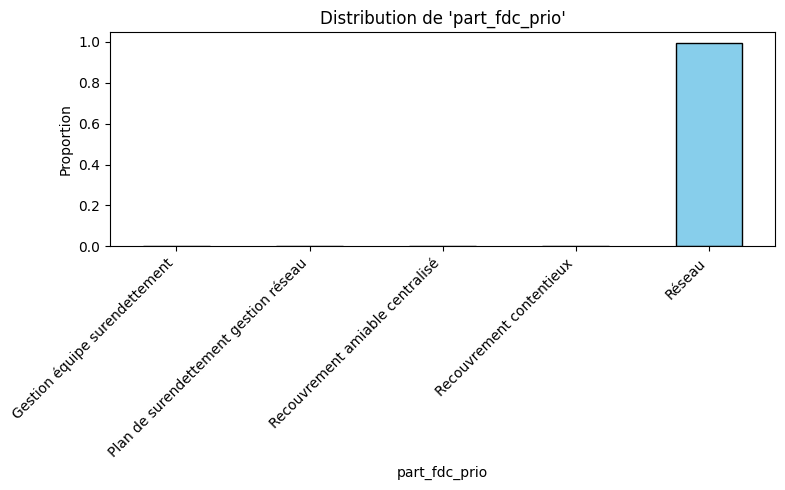

In [32]:
def plot_categorical_distribution(df, var, target=None):
    plt.figure(figsize=(8, 5))

    if target is None:
        # Distribution simple
        df[var].value_counts(normalize=True).sort_index().plot(
            kind='bar', color='skyblue', edgecolor='black'
        )
        plt.title(f"Distribution de '{var}'")
        plt.ylabel("Proportion")
        plt.xlabel(var)
    else:
        # Distribution par classe cible
        prop_df = (
            df.groupby([var, target])
              .size()
              .groupby(level=0)
              .apply(lambda x: x / x.sum())
              .unstack()
        )

        prop_df.plot(kind='bar', stacked=False, color=['lightcoral', 'skyblue'], edgecolor='black')
        plt.title(f"Distribution de '{var}' selon '{target}'")
        plt.ylabel("Proportion")
        plt.xlabel(var)
        plt.legend(title=target)

    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

plot_categorical_distribution(data,'part_fdc_prio')

In [33]:
from scipy.stats import chi2_contingency
from scipy.stats import kruskal

def cramers_v(data, x, y, seuil=5):
    # Table de contingence
    data2=data.copy()
    data2= data[[x, y]].dropna()
    table = pd.crosstab(data2[x], data2[y])
    # Test du chi-deux
    chi2, _, _, expected = chi2_contingency(table)
    # Calcul du V de Cramer
    n = table.sum().sum()
    k = min(table.shape) - 1
    v = np.sqrt(chi2 / (n * k))
    validite=False
    if (expected >= seuil).all():
        validite=True
    return v, validite

def kruskal_by_target(df, col_quanti, col_cible):
    # Séparer les groupes selon la cible
    data=df.copy()
    data = data[[col_quanti, col_cible]].dropna()
    group0 = data[data[col_cible] == 0][col_quanti]
    group1 = data[data[col_cible] == 1][col_quanti]

    # Effectuer le test de Kruskal-Wallis
    stat, p_value = kruskal(group0, group1)
    return stat, p_value

def analyze_features(df, col_cible):
    results = []

    for col in df.columns:
        if col == col_cible:
            continue

        if df[col].dtype == 'object' or df[col].dtype.name == 'category':
            # Variable catégorielle → V de Cramer
            v, validite = cramers_v(df, col, col_cible)
            if validite:
                results.append({'var': col, 'type': 'v_cramer', 'value': v*100})
            else: 
                results.append({'var': col, 'type': 'v_cramer_non_valide', 'value': v*100})
        else:
            # Variable numérique → p-value Kruskal-Wallis
            try:
                stat, _ = kruskal_by_target(df, col, col_cible)
                results.append({'var': col, 'type': 'stat_kruskal_wallis', 'value': stat})
            except Exception:
                print(f"Colonne à problème {col}")
    return pd.DataFrame(results)

In [34]:
first_var_selection=analyze_features(df_train.drop("month", axis=1), "cible")
first_var_selection

,var,type,value
0,sldcrdmms_sum_mm1,stat_kruskal_wallis,921.319957
1,engagement_sum_mm1,stat_kruskal_wallis,129.097206
2,top_pret_conso_mm1,v_cramer,2.333359
3,nbr_pret_conso_mm1,stat_kruskal_wallis,23.972213
4,sldcrdmms_sum_mm2,stat_kruskal_wallis,873.135630
...,...,...,...
119,crtad_ag_nbjde_bb,stat_kruskal_wallis,832.577788
120,crtad_ag_nbjde_ba,stat_kruskal_wallis,720.204608
121,crtad_ag_nbjde_bc,stat_kruskal_wallis,368.642585
122,topcptlitig,v_cramer_non_valide,2.393309


In [35]:
## les variabes qualitatives
variables_qual=first_var_selection[first_var_selection["type"]!="stat_kruskal_wallis"]
variables_qual_pre_finales=variables_qual[variables_qual["value"]>=20]
variables_qual_pre_finales

,var,type,value
38,ind_dp_max,v_cramer_non_valide,29.964430
55,client_haut_risque,v_cramer,24.534611


In [36]:
print(df_train['ind_dp_max'].value_counts())
##il y a un problème avec cette variable (la modalité 5 est trop delaissée, on va fusionner les modalités 1-5

ind_dp_max
0    40773
1     1907
3      346
2      214
5        2
Name: count, dtype: int64


In [37]:
print(df_train['client_haut_risque'].value_counts())
##ici c'est sans problème

client_haut_risque
0.0    42200
1.0     1042
Name: count, dtype: int64


In [38]:
variables_quant=first_var_selection[first_var_selection["type"]=="stat_kruskal_wallis"]
variables_quant

,var,type,value
0,sldcrdmms_sum_mm1,stat_kruskal_wallis,921.319957
1,engagement_sum_mm1,stat_kruskal_wallis,129.097206
3,nbr_pret_conso_mm1,stat_kruskal_wallis,23.972213
4,sldcrdmms_sum_mm2,stat_kruskal_wallis,873.135630
5,engagement_sum_mm2,stat_kruskal_wallis,132.733038
...,...,...,...
118,encours_par,stat_kruskal_wallis,507.697749
119,crtad_ag_nbjde_bb,stat_kruskal_wallis,832.577788
120,crtad_ag_nbjde_ba,stat_kruskal_wallis,720.204608
121,crtad_ag_nbjde_bc,stat_kruskal_wallis,368.642585


In [39]:
def plot_regle_du_coude(noms_variables, valeurs_stat, titre="Règle du coude", tri=True):
    # Tri décroissant
    if tri:
        data = sorted(zip(noms_variables, valeurs_stat), key=lambda x: x[1], reverse=True)
        noms_variables, valeurs_stat = zip(*data)

    # Création de la figure
    plt.figure(figsize=(12, 5))
    plt.plot(noms_variables, valeurs_stat, marker='o')
    
    # Mise en forme
    plt.title(titre, fontsize=14)
    plt.xlabel("Variables", fontsize=12)
    plt.ylabel("Valeur statistique", fontsize=12)

    # Rotation pour lisibilité
    plt.xticks(rotation=90)

    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

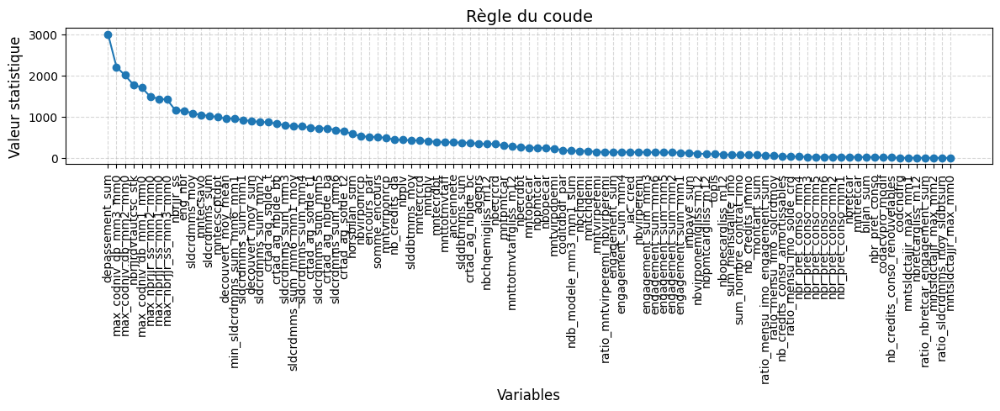

In [40]:
col_names=list(variables_quant["var"])
valeurs_stat=list(variables_quant["value"])
plot_regle_du_coude(col_names, valeurs_stat, titre="Règle du coude", tri=True)

In [41]:
nom_var_seuil="crtad_ag_solde_t2"
liste_triee = [x for _, x in sorted(zip(valeurs_stat, col_names), reverse=True)]
variables_pre_finales_quant=liste_triee[0:liste_triee.index(nom_var_seuil)+1]
print(f"Nombre de variables {len(variables_pre_finales_quant)} et les voici {variables_pre_finales_quant}")

Nombre de variables 29 et les voici ['depassement_sum', 'max_codniv_db_mm3_mm0', 'max_codniv_db_mm2_mm0', 'nbrjjrdvtautcsc_stk', 'max_codniv_db_mm1_mm0', 'max_nbrjjr_ss_mm2_mm0', 'max_nbrjjr_ss_mm1_mm0', 'max_nbrjjr_ss_mm3_mm0', 'nbrjjr_ss', 'eng_nbr', 'sldcrdmms_moy', 'mntecsavo', 'sldcrdmms_sum', 'mntecscptdpt', 'decouvert_moy_mean', 'min_sldcrdmms_sum_mm6_mm1', 'sldcrdmms_sum_mm1', 'decouvert_moy_sum', 'sldcrdmms_sum_mm2', 'crtad_ag_solde_t', 'crtad_ag_nbjde_bb', 'sldcrdmms_sum_mm3', 'sldcrdmms_sum_mm6_mm1_moy', 'sldcrdmms_sum_mm4', 'crtad_ag_solde_t1', 'sldcrdmms_sum_mm5', 'crtad_ag_nbjde_ba', 'sldcrdmms_sum_mm6', 'crtad_ag_solde_t2']


In [42]:
##Etapes à venir
##Faire la discretisation
#Sélectionner les variables selon après discrétisation
#Lancer le modèle logistique
#Faire le tableau
##Calculer les performances

In [43]:
##discretisation avec les arbres
from sklearn.tree import DecisionTreeClassifier

def discretize_with_tree(df, col, cible, max_depth=2):
    X = df[[col]]
    y = df[cible]

    # Entraînement de l'arbre
    tree = DecisionTreeClassifier(max_depth=max_depth, criterion="gini", class_weight="balanced", random_state=42)
    tree.fit(X, y)

    # Extraction et tri des seuils
    thresholds = tree.tree_.threshold[tree.tree_.threshold != -2]
    thresholds = np.sort(thresholds)

    # Discrétisation avec np.digitize
    discretized = pd.Series(np.digitize(df[col], bins=thresholds), index=df.index)

    discretized[df[col].isna()] = -1

    return thresholds, discretized.astype('category')

In [44]:
df_train["cible"].value_counts()

cible
0    42649
1      593
Name: count, dtype: int64

In [45]:
##on discretise all les variables quantitatives
df_train2=df_train.copy()
df_test2=df_test.copy()
data_kaggle2=data_kaggle.copy()
all_thresholds= {}
for col in variables_pre_finales_quant:
    thresholds, df_train2[col]=discretize_with_tree(df_train2, col, "cible")

    discretized = pd.Series(np.digitize(df_test2[col], bins=thresholds), index=df_test2.index)
    df_test2[col]=discretized.astype('category')

    try:
        discretized_kaggle = pd.Series(np.digitize(data_kaggle2[col], bins=thresholds), index=data_kaggle2.index)
        data_kaggle2[col]=discretized_kaggle.astype('category')
    except Exception:
        print(f"probleme avec {col}")
    all_thresholds[col]=thresholds

In [46]:
data_kaggle["sldcrdmms_sum_mm6"].value_counts()

sldcrdmms_sum_mm6
0.0         1950
45.0          10
27.0           9
8.0            8
14.0           7
            ... 
7057.0         1
23555.0        1
76690.0        1
194877.0       1
140152.0       1
Name: count, Length: 44490, dtype: int64

In [47]:
## Validation des discretisations
def verifier_contraintes(df, var_discret, cible, min_pop=5, min_diff_cible=30):
    # 1. Calcul de la proportion de population par modalité
    counts = df[var_discret].value_counts(normalize=True)*100
    counts = counts.round(2)
    population_ok = (counts >= min_pop).all()

    # 2. Calcul du taux de cible par modalité
    taux_cible = df.groupby(var_discret, observed=True)[cible].mean()*100
    taux_cible=taux_cible.round(2)

    # Vérifier si la différence minimale entre toutes les paires de modalités est >= min_diff_cible
    taux_diff_ok = True
    modalities = taux_cible.index.tolist()

    for i in range(len(modalities)):
        for j in range(i+1, len(modalities)):
            diff = abs(taux_cible[modalities[i]] - taux_cible[modalities[j]])
            if diff < min_diff_cible:
                taux_diff_ok = False
                break
        if not taux_diff_ok:
            break

    details = {
        'proportions': counts.to_dict(),
        'taux_cible': taux_cible.to_dict()
    }

    return bool(population_ok and taux_diff_ok), details

def verifier_contraintes_for_all(df, var_discret_list, cible, min_pop=5, min_diff_cible=30):
    results = {}
    for var in var_discret_list:
        ok, details = verifier_contraintes(df, var, cible, min_pop, min_diff_cible)
        results[var] = {
            'ok': ok,
            'details': details
        }
    return results

In [48]:
all_results=verifier_contraintes_for_all(df=df_train2, var_discret_list=variables_pre_finales_quant, cible="cible", min_pop=5)
for _, var in enumerate(all_results):
    if all_results[var]['ok']==False:
        print(var)

depassement_sum
max_codniv_db_mm3_mm0
max_codniv_db_mm2_mm0
nbrjjrdvtautcsc_stk
max_codniv_db_mm1_mm0
max_nbrjjr_ss_mm2_mm0
max_nbrjjr_ss_mm1_mm0
max_nbrjjr_ss_mm3_mm0
nbrjjr_ss
eng_nbr
sldcrdmms_moy
mntecsavo
sldcrdmms_sum
mntecscptdpt
decouvert_moy_mean
min_sldcrdmms_sum_mm6_mm1
sldcrdmms_sum_mm1
decouvert_moy_sum
sldcrdmms_sum_mm2
crtad_ag_solde_t
crtad_ag_nbjde_bb
sldcrdmms_sum_mm3
sldcrdmms_sum_mm6_mm1_moy
sldcrdmms_sum_mm4
crtad_ag_solde_t1
sldcrdmms_sum_mm5
crtad_ag_nbjde_ba
sldcrdmms_sum_mm6
crtad_ag_solde_t2


In [49]:
def analyze_stability_grid(df, variables, cible):
    ordre_mois = ['Jan', 'Fev', 'Mars', 'Avril', 'Mai', 'Juin',
                  'Juil', 'Août', 'Sept', 'Oct', 'Nov', 'Dec']
    
    n = len(variables)
    fig, axes = plt.subplots(n, 2, figsize=(15, 7*n))
    fig.tight_layout(pad=3)
    
    # ⚠️ CORRECTION : Gestion correcte des axes selon le nombre de variables
    if n == 1:
        axes = axes.reshape(1, -1)  # Transforme en array 2D (1, 2)
    
    for i, col in enumerate(variables):
        # 1️⃣ Taux cible par mois et modalité
        taux = (
            df.groupby(['month', col], observed=True)[cible]
            .mean()
            .reset_index(name='taux_1')
        )
        taux['month'] = pd.Categorical(taux['month'], categories=ordre_mois, ordered=True)
        
        # 2️⃣ Proportions par mois
        proportions = (
            df.groupby(['month', col], observed=True)
            .size()
            .reset_index(name='count')
        )
        proportions['proportion'] = (
            proportions.groupby('month', observed=True)['count']
            .transform(lambda x: x / x.sum())
        )
        proportions = proportions[['month', col, 'proportion']]
        proportions['month'] = pd.Categorical(proportions['month'], categories=ordre_mois, ordered=True)
        
        # ---- GRAPH 1 : TAUX ----
        ax1 = axes[i, 0]  # 👈 Accès uniforme avec [i, 0]
        sns.lineplot(
            data=taux, x='month', y='taux_1', hue=col, ax=ax1, marker='o'
        )
        ax1.set_title(f"Risk selon {col}")
        ax1.set_xlabel("Mois")
        ax1.set_ylabel(f"% de risque")
        ax1.grid(True, linestyle='--', alpha=0.5)
        ax1.legend(title=col)
        
        # ---- GRAPH 2 : PROPORTIONS ----
        ax2 = axes[i, 1]  # 👈 Accès uniforme avec [i, 1]
        sns.lineplot(
            data=proportions, x='month', y='proportion', hue=col, ax=ax2, marker='o'
        )
        ax2.set_title(f"Distribution de {col}")
        ax2.set_xlabel("Mois")
        ax2.set_ylabel("Prop.")
        ax2.grid(True, linestyle='--', alpha=0.5)
        ax2.legend(title=col)
    
    plt.show()

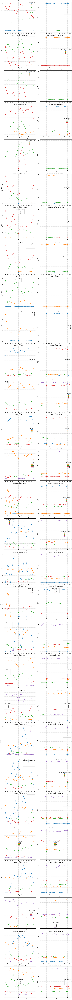

In [50]:
analyze_stability_grid(df_train2, variables_pre_finales_quant, 'cible')

In [51]:
##on va raffiner notre discrétisation
def apply_mappings_and_recat(data, mappings):
    df=data.copy()
    for spec in mappings:
        col = spec["col"]
        mapping = spec["map"]

        # 1. Appliquer le mapping
        df[col] = df[col].astype(int).replace(mapping).astype('category')
    return df

In [52]:
mappings = [
    {"col": "depassement_sum", "map": {3: 1, 2:1}},
    {"col": "max_codniv_db_mm3_mm0", "map": {2: 1, -1: 1}},
    {"col": "max_codniv_db_mm2_mm0", "map": {-1: 1, 2:1}},
    {"col": "nbrjjrdvtautcsc_stk", "map": {0:1}},
    {"col": "max_codniv_db_mm1_mm0", "map": {-1: 1, 2: 1}},
    {"col": "max_nbrjjr_ss_mm2_mm0", "map": {2: 1, -1: 1}},
    {"col": "max_nbrjjr_ss_mm1_mm0", "map": {2: 1, -1: 1}},
    {"col": "max_nbrjjr_ss_mm3_mm0", "map": {2: 1, -1: 1}},
    {"col": "nbrjjr_ss", "map": {2: 1}},
    {"col": "eng_nbr", "map": {2: 1}},
    {"col": "sldcrdmms_moy", "map": {2:1}},
    {"col": "mntecsavo", "map": {-1:3}},
    {"col": "sldcrdmms_sum", "map": {3:2}},
    {"col": "mntecscptdpt", "map": {1: 0, 2: 0, -1: 0}},
    {"col": "decouvert_moy_mean", "map": {2:1}},
    {"col": "min_sldcrdmms_sum_mm6_mm1", "map": {3:2, -1:0}},
    {"col": "sldcrdmms_sum_mm1", "map": {-1:0, 2:1}},
    {"col": "decouvert_moy_sum", "map": {3:1}},
    {"col": "sldcrdmms_sum_mm2", "map": {-1: 0, 2:1}},
    {"col": "crtad_ag_solde_t", "map": {3:2, -1:2}},
    {"col": "crtad_ag_nbjde_bb", "map": {-1:0, 1:0}},
    {"col": "sldcrdmms_sum_mm3", "map": {-1:0, 2:1}},
    {"col": "sldcrdmms_sum_mm6_mm1_moy", "map": {-1:0, 2:1}},
    {"col": "sldcrdmms_sum_mm4", "map": {-1: 0, 3:2}},
    {"col": "crtad_ag_solde_t1", "map": {-1:2, 3:2}},
    {"col": "sldcrdmms_sum_mm5", "map": {-1:0, 1:0}},
    {"col": "crtad_ag_nbjde_ba", "map": {-1:0, 3:1, 2:1}},
    {"col": "sldcrdmms_sum_mm6", "map": {-1:0, 2:1}},
    {"col": "crtad_ag_solde_t2", "map": {-1:3, 2:1}},
    {"col": "ind_dp_max", "map": {5:3}}
]

In [53]:
df_train3=apply_mappings_and_recat(df_train2, mappings)
df_test3=apply_mappings_and_recat(df_test2, mappings)
data_kaggle3=apply_mappings_and_recat(data_kaggle2, mappings)

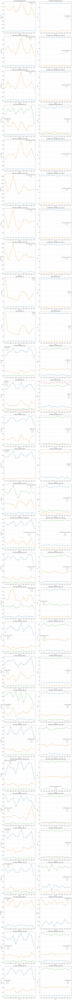

In [54]:
##stabilité après avoir affiné la discrétisation
analyze_stability_grid(df_train3, variables_pre_finales_quant, 'cible')

In [55]:
def ordonner_matrice_par_premiere_colonne(matrice_corr):
    # Nom de la première colonne
    col0 = matrice_corr.columns[0]

    # Obtenir l'ordre décroissant selon la première colonne
    ordre = matrice_corr[col0].sort_values(ascending=False).index

    # Réordonner les lignes et colonnes selon cet ordre
    matrice_reordonnee = matrice_corr.loc[ordre, ordre]

    return matrice_reordonnee 

def matrice_cramers_v(data, variables, seuil=5):
    result = pd.DataFrame(index=variables, columns=variables, dtype=float)
    for var1 in variables:
        for var2 in variables:
            if var1 == var2:
                result.loc[var1, var2] = 1.0
            else:
                v, _ = cramers_v(data, var1, var2, seuil=seuil)
                result.loc[var1, var2] = v         
    return ordonner_matrice_par_premiere_colonne(result)

def creer_liste_variables(var_qual, var_quant, cible):
    return [cible]+var_qual+var_quant

In [56]:
cols=creer_liste_variables(list(variables_qual_pre_finales["var"]), variables_pre_finales_quant, "cible")
matrices_v_cramers=matrice_cramers_v(df_train3, cols)

In [57]:
matrices_v_cramers

,cible,ind_dp_max,depassement_sum,client_haut_risque,mntecsavo,nbrjjrdvtautcsc_stk,sldcrdmms_moy,sldcrdmms_sum,max_codniv_db_mm3_mm0,max_codniv_db_mm2_mm0,...,crtad_ag_solde_t1,nbrjjr_ss,eng_nbr,crtad_ag_nbjde_bb,mntecscptdpt,crtad_ag_solde_t2,decouvert_moy_mean,decouvert_moy_sum,sldcrdmms_sum_mm5,crtad_ag_nbjde_ba
cible,1.000000,0.295660,0.260271,0.245346,0.240269,0.234709,0.233086,0.227808,0.225425,0.214828,...,0.167487,0.161916,0.161916,0.156792,0.155951,0.151286,0.150303,0.143890,0.138298,0.094200
ind_dp_max,0.295660,1.000000,0.849691,0.720339,0.226589,0.457919,0.305605,0.314451,0.727336,0.761798,...,0.235744,0.345050,0.345050,0.239191,0.312968,0.219453,0.229360,0.227190,0.204383,0.185145
depassement_sum,0.260271,0.849691,1.000000,0.389593,0.395305,0.501639,0.420378,0.438424,0.372636,0.366236,...,0.341289,0.273339,0.273339,0.296768,0.335577,0.321814,0.311596,0.314644,0.303965,0.205433
client_haut_risque,0.245346,0.720339,0.389593,1.000000,0.185942,0.344928,0.277481,0.269364,0.699135,0.677902,...,0.212161,0.034129,0.034129,0.203224,0.157784,0.200815,0.167680,0.158473,0.167907,0.131702
mntecsavo,0.240269,0.226589,0.395305,0.185942,1.000000,0.435679,0.592642,0.587239,0.198689,0.200896,...,0.511336,0.161033,0.161033,0.449433,0.703853,0.499399,0.415745,0.421769,0.465015,0.433086
nbrjjrdvtautcsc_stk,0.234709,0.457919,0.501639,0.344928,0.435679,1.000000,0.494841,0.481260,0.352382,0.358033,...,0.391698,0.185233,0.185233,0.473195,0.519477,0.362827,0.425668,0.437429,0.313394,0.362907
sldcrdmms_moy,0.233086,0.305605,0.420378,0.277481,0.592642,0.494841,1.000000,0.739195,0.275680,0.276399,...,0.520471,0.140214,0.140214,0.463959,0.802982,0.510643,0.431435,0.441077,0.491463,0.453522
sldcrdmms_sum,0.227808,0.314451,0.438424,0.269364,0.587239,0.481260,0.739195,1.000000,0.265452,0.266141,...,0.512745,0.146764,0.146764,0.405464,0.718619,0.458263,0.368557,0.357010,0.457350,0.341614
max_codniv_db_mm3_mm0,0.225425,0.727336,0.372636,0.699135,0.198689,0.352382,0.275680,0.265452,1.000000,0.945483,...,0.217565,0.045353,0.045353,0.234155,0.158565,0.192853,0.160386,0.150398,0.162847,0.114007
max_codniv_db_mm2_mm0,0.214828,0.761798,0.366236,0.677902,0.200896,0.358033,0.276399,0.266141,0.945483,1.000000,...,0.211420,0.038176,0.038176,0.227350,0.156201,0.188507,0.157644,0.147944,0.161420,0.107484


In [58]:
matrices_v_cramers.loc["ind_dp_max",]

cible                        0.295660
ind_dp_max                   1.000000
depassement_sum              0.849691
client_haut_risque           0.720339
mntecsavo                    0.226589
nbrjjrdvtautcsc_stk          0.457919
sldcrdmms_moy                0.305605
sldcrdmms_sum                0.314451
max_codniv_db_mm3_mm0        0.727336
max_codniv_db_mm2_mm0        0.761798
sldcrdmms_sum_mm1            0.289394
min_sldcrdmms_sum_mm6_mm1    0.262242
max_codniv_db_mm1_mm0        0.808949
sldcrdmms_sum_mm2            0.274413
crtad_ag_solde_t             0.252358
max_nbrjjr_ss_mm2_mm0        0.296458
max_nbrjjr_ss_mm1_mm0        0.285901
sldcrdmms_sum_mm3            0.261467
max_nbrjjr_ss_mm3_mm0        0.300620
sldcrdmms_sum_mm6_mm1_moy    0.293305
sldcrdmms_sum_mm4            0.257348
sldcrdmms_sum_mm6            0.252306
crtad_ag_solde_t1            0.235744
nbrjjr_ss                    0.345050
eng_nbr                      0.345050
crtad_ag_nbjde_bb            0.239191
mntecscptdpt

In [60]:
def has_perfect_modality(df, target, var):
    for modality, group in df.groupby(var, observed=True):
        prop = group[target].mean()
        if prop == 0 or prop == 1:
            return True
    return False
    
target="cible"
for var in cols:
    if var!=target:
        if has_perfect_modality(df_train3, "cible", var):
            print(f"!!!{var} has perfect modality")

In [63]:
from sklearn.metrics import accuracy_score, roc_auc_score, average_precision_score
import statsmodels.formula.api as smf

def all_coeff_of_var_significants(model, var, seuil=0.05):
    # Récupérer les p-values de la variable ind_dp_max
    pvals_ind_dp_max = model.pvalues[model.pvalues.index.str.startswith(f"C({var}")]
    # Tester si toutes sont < 0.05
    all_significant = (pvals_ind_dp_max <= seuil).all()
    return bool(all_significant)

def all_selected_coeffs_significant(model, selected_vars, seuil=0.05):
    for var in selected_vars:
        pvals_var = model.pvalues[model.pvalues.index.str.startswith(f"C({var}")]  # tous les coefficients d'une var catégorielle
        if not (pvals_var <= seuil).all():
            return False
    return True

def forward_selection_logit(data, target, cramers_matrix, threshold=0.6):
    df=data.copy()
    variables = [col for col in cramers_matrix.columns if col != target]
    selected_vars = []
    metrics_history = []
    y = df[target]

    for var in variables:
        # Si ce n’est pas la première variable, vérifier la corrélation
        if selected_vars:
            too_correlated = False
            for sel_var in selected_vars:
                if cramers_matrix.loc[var, sel_var] > threshold:
                    too_correlated = True
                    print(f"Variable '{var}' trop corrélée avec '{sel_var}', sautée.")
                    break
            if too_correlated:
                continue

        # Ajouter la variable (première ou non)
        selected_vars.append(var)

        formula = target + ' ~ ' + ' + '.join(
        [f"C({col})" for col in selected_vars if col != target]
        )
        print(formula)
        model = smf.logit(formula=formula, data=df).fit()
        if not all_coeff_of_var_significants(model, var):
            print(f"Variable {var} non significatifs, donc sautée")
            continue
        if not all_selected_coeffs_significant(model, selected_vars) :
            print(f"Variable {var} modifie la significativité d'autres var, donc sautée")
            continue
        # Ajuster le modèle logistique
        y_pred_prob = model.predict(df)
        y_pred = (y_pred_prob >= 0.5).astype(int)

        # Calculer les métriques sur le train
        accuracy = accuracy_score(y, y_pred)
        auc = roc_auc_score(y, y_pred_prob)
        auc_pr=average_precision_score(y, y_pred_prob)

        metrics_history.append({
            'var': var,
            'accur': accuracy,
            'auc': auc,
            'auc_pr': auc_pr
        })
    return pd.DataFrame(metrics_history)

In [64]:
##Sélection de variables finales
final_variables=forward_selection_logit(df_train3, "cible", matrices_v_cramers, threshold=0.6)

cible ~ C(ind_dp_max)
Optimization terminated successfully.
         Current function value: 0.056825
         Iterations 9
Variable 'depassement_sum' trop corrélée avec 'ind_dp_max', sautée.
Variable 'client_haut_risque' trop corrélée avec 'ind_dp_max', sautée.
cible ~ C(ind_dp_max) + C(mntecsavo)
Optimization terminated successfully.
         Current function value: 0.049494
         Iterations 11
cible ~ C(ind_dp_max) + C(mntecsavo) + C(nbrjjrdvtautcsc_stk)
Optimization terminated successfully.
         Current function value: 0.048946
         Iterations 11
cible ~ C(ind_dp_max) + C(mntecsavo) + C(nbrjjrdvtautcsc_stk) + C(sldcrdmms_moy)
Optimization terminated successfully.
         Current function value: 0.048519
         Iterations 11
Variable 'sldcrdmms_sum' trop corrélée avec 'sldcrdmms_moy', sautée.
Variable 'max_codniv_db_mm3_mm0' trop corrélée avec 'ind_dp_max', sautée.
Variable 'max_codniv_db_mm2_mm0' trop corrélée avec 'ind_dp_max', sautée.
Variable 'sldcrdmms_sum_mm1' tr

In [65]:
final_variables

,var,accur,auc,auc_pr
0,ind_dp_max,0.986286,0.776060,0.117351
1,mntecsavo,0.986286,0.922506,0.162929
2,nbrjjrdvtautcsc_stk,0.986286,0.928869,0.176249
3,sldcrdmms_moy,0.986286,0.932302,0.184809
4,min_sldcrdmms_sum_mm6_mm1,0.986286,0.935720,0.183424
5,max_nbrjjr_ss_mm2_mm0,0.986402,0.944331,0.206998


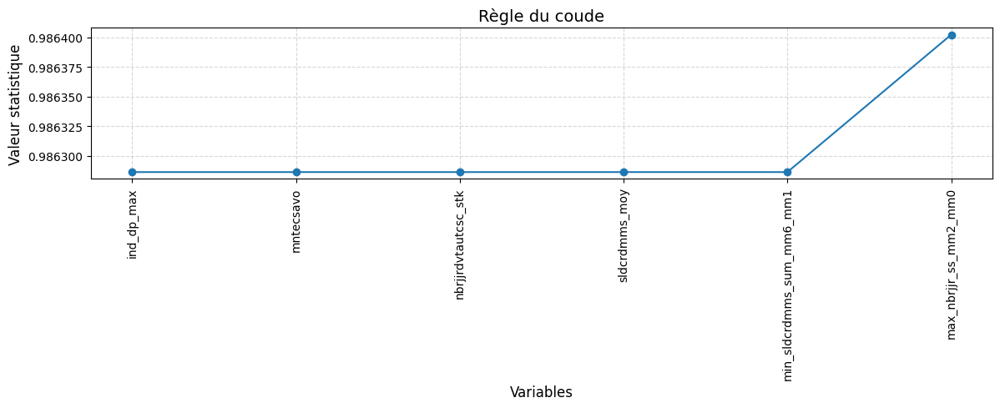

In [66]:
##on visualise l'évolution de l'accuracy
plot_regle_du_coude(list(final_variables["var"]), list(final_variables["accur"]), titre="Règle du coude", tri=False)

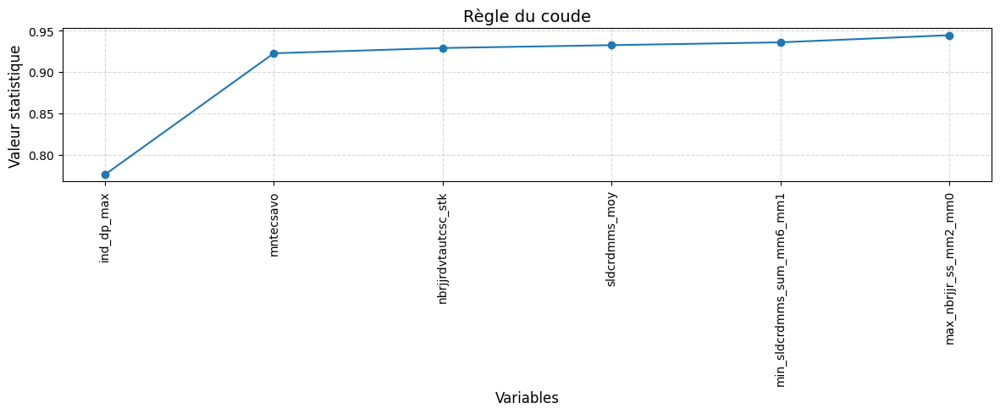

In [67]:
##on visualise l'évolution de l'AUC ROC
plot_regle_du_coude(final_variables["var"], final_variables["auc"], titre="Règle du coude", tri=False)

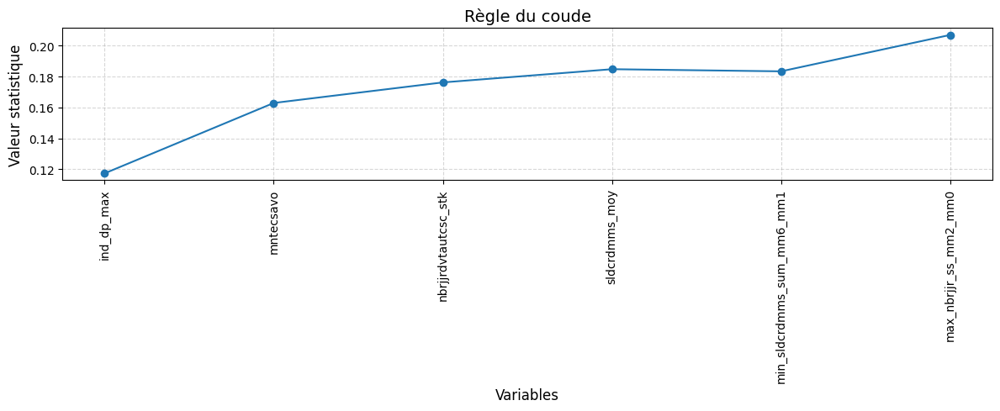

In [68]:
##on visualise l'évolution de l'AUC PC
plot_regle_du_coude(final_variables["var"], final_variables["auc_pr"], titre="Règle du coude", tri=False)

In [69]:
#variables finales
finales=list(final_variables["var"])
finales_bis=['ind_dp_max',
 'mntecsavo',
 'nbrjjrdvtautcsc_stk',
 'sldcrdmms_moy',
 'max_nbrjjr_ss_mm2_mm0']
finales

['ind_dp_max',
 'mntecsavo',
 'nbrjjrdvtautcsc_stk',
 'sldcrdmms_moy',
 'min_sldcrdmms_sum_mm6_mm1',
 'max_nbrjjr_ss_mm2_mm0']

In [70]:
def reorder_modalites(data, col, cible):
    # 1️⃣ Calcul du taux de 1 par modalité
    df=data.copy()
    taux = df.groupby(col, observed=True)[cible].mean().sort_values()
    
    # 2️⃣ Création d’un mapping modalité → code ordonné
    mapping = {modalite: i for i, modalite in enumerate(taux.index)}
    
    return df[col].map(mapping), mapping

def reorder_modalites_for_list(df, cat_vars, cible):
    for col in cat_vars:
        df[col], _ = reorder_modalites(df, col, cible)
    return df

In [71]:
import statsmodels.formula.api as smf
def launching_logistique_model(data_train, target):
    df=data_train.copy()
    cat_vars = df.select_dtypes(include=['object', 'category']).columns.tolist()
    df=reorder_modalites_for_list(df, cat_vars, target)
    # Partie explicative : C() pour les catégorielles, rien pour les numériques
    formula = target + ' ~ ' + ' + '.join(
        [f"C({col}, Treatment(reference=0))" for col in df.columns if col != target]
        )
    model = smf.logit(formula=formula, data=df).fit()
    print(model.summary())
    return model, df

In [72]:
data_to_launch=df_train3[["cible"]+finales]
model, df_train_order=launching_logistique_model(data_to_launch, "cible")

Optimization terminated successfully.
         Current function value: 0.046911
         Iterations 11
                           Logit Regression Results                           
Dep. Variable:                  cible   No. Observations:                43242
Model:                          Logit   Df Residuals:                    43228
Method:                           MLE   Df Model:                           13
Date:                Fri, 19 Dec 2025   Pseudo R-squ.:                  0.3524
Time:                        05:29:49   Log-Likelihood:                -2028.5
converged:                       True   LL-Null:                       -3132.5
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                                                coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------------------------
Intercept    

In [76]:
from sklearn.calibration import calibration_curve
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score, classification_report
from sklearn.metrics import roc_curve, average_precision_score, auc, brier_score_loss, precision_recall_curve
from matplotlib.ticker import FuncFormatter

def reliability_diagram(y_true, y_score, n_bins=20):
    prob_true, prob_pred = calibration_curve(y_true, y_score, n_bins=n_bins)

    fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(7, 7), sharex=True, constrained_layout=True)
    
    ax1.plot(prob_pred, prob_true, marker='o', linewidth=2, label=f"Model (Brier={brier_score_loss(y_true, y_score):.2%})")
    ax1.plot([0,1],[0,1], linestyle='--', color='gray', label='Perfect calibration')
    ax1.set_xlabel("Mean predicted probability")
    ax1.set_ylabel("Fraction of positives")
    ax1.set_title("Reliability diagram (calibration curve)")
    ax1.legend(loc="best")
    ax1.grid(alpha=0.3)
    
    ax2.hist(y_score, bins=n_bins, color='C0', edgecolor='k', alpha=0.7)
    ax2.set_xlabel("Predicted probability")
    ax2.set_ylabel("Count")
    ax2.set_title("Histogram of predicted probabilities")
    ax2.grid(alpha=0.2)
    
    N = len(y_score) if len(y_score) > 0 else 1
    ax_perc = ax2.twinx()

    primary_yticks = ax2.get_yticks()
    secondary_yticks = primary_yticks / N 

    ax_perc.set_yticks(primary_yticks)  # positionner aux mêmes valeurs numériques que l'axe gauche
    ax_perc.set_ylim(ax2.get_ylim())  # garder mêmes limites pour alignement visuel
    ax_perc.set_ylabel("Share of total (%)")
    ax_perc.yaxis.set_major_formatter(FuncFormatter(lambda y, _: f"{100.0 * (y / N):.0f}%"))
    
    plt.show()

def auc_roc_plot(y_true, y_pred_prob):
    fpr, tpr, thresholds = roc_curve(y_true, y_pred_prob)
    roc_auc = auc(fpr, tpr)
    plt.figure(figsize=(8,8))
    plt.plot(fpr, tpr, color="C0", lw=2, label=f"ROC (AUC = {roc_auc:.2%})")
    plt.plot([0,1],[0,1], color="grey", lw=1, linestyle="--", label="Alea")
    plt.fill_between(fpr, tpr, alpha=0.15, color="C0")
    plt.xlim([-0.01, 1.01])
    plt.ylim([-0.01, 1.01])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Courbe ROC")
    plt.legend(loc="lower right")
    plt.grid(alpha=0.3)
    plt.show()

def auc_pr_plot(y_true, y_pred_prob):
    precision, recall, thresholds = precision_recall_curve(y_true, y_pred_prob)
    plt.figure(figsize=(7,6))
    plt.plot(recall, precision, color="C0", lw=2, label=f"PR curve (AP = {average_precision_score(y_true, y_pred_prob):.2%})")
    plt.hlines(y_true.mean(), 0, 1, colors="grey", linestyles="--", label=f"Baseline (prevalence = {y_true.mean():.2%})")
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title("Courbe Precision-Recall")
    plt.legend(loc="lower left")
    plt.grid(alpha=0.3)
    plt.show()

def metrics_for_model(model, data, cible):
    df=data.copy()
    cat_vars = df.select_dtypes(include=['object', 'category']).columns.tolist()
    df=reorder_modalites_for_list(df, cat_vars, target)

    y_true=df[cible]
    y_pred_prob = model.predict(df)
    # 2️⃣ Transformer en classes (0 ou 1) selon un seuil (souvent 0.5)
    y_pred = (y_pred_prob >= 0.5).astype(int)
    # AUC ROC
    auc_roc_plot(y_true, y_pred_prob)
    #4️⃣ Calcul des métriques
    print("✅ Accuracy :", accuracy_score(y_true, y_pred))
    print("✅ Confusion matrix :\n", confusion_matrix(y_true, y_pred))
    print("\n✅ Rapport de classification :\n", classification_report(y_true, y_pred))
    ##AUC PR
    auc_pr_plot(y_true, y_pred_prob)
    #Score de brier
    reliability_diagram(y_true, y_pred_prob)

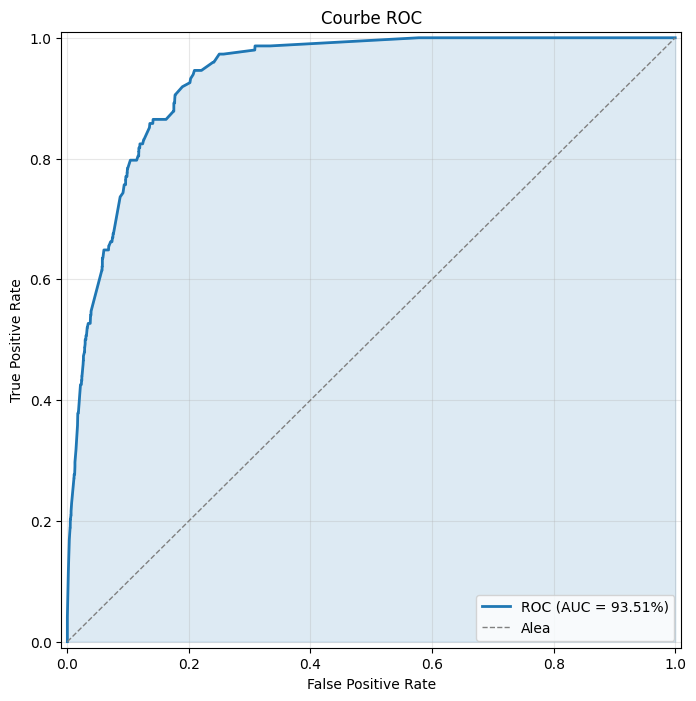

✅ Accuracy : 0.9866802330959208
✅ Confusion matrix :
 [[10663     0]
 [  144     4]]

✅ Rapport de classification :
               precision    recall  f1-score   support

           0       0.99      1.00      0.99     10663
           1       1.00      0.03      0.05       148

    accuracy                           0.99     10811
   macro avg       0.99      0.51      0.52     10811
weighted avg       0.99      0.99      0.98     10811



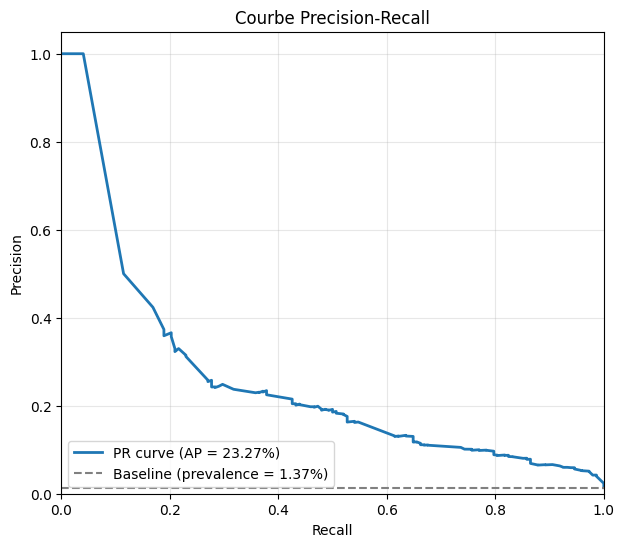

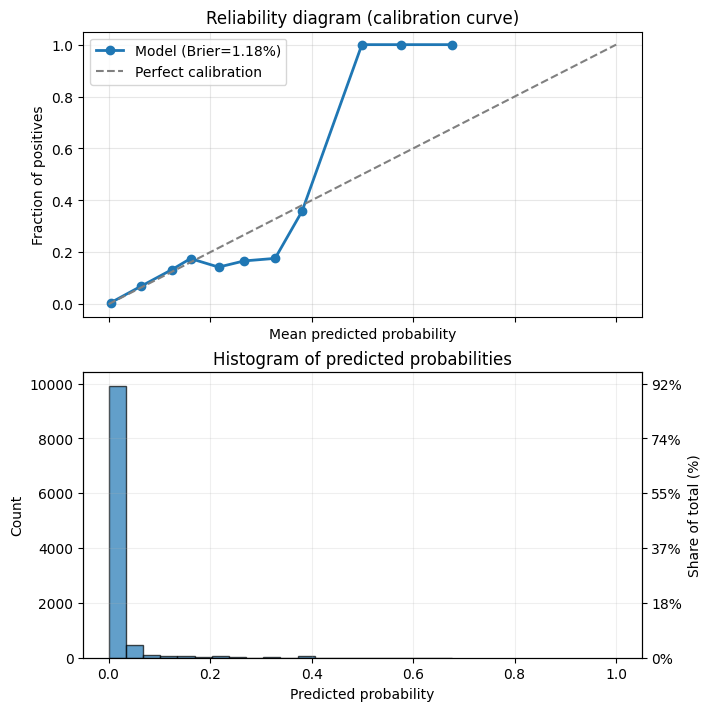

In [78]:
metrics_for_model(model, df_test3, "cible")

In [112]:
def build_scorecard(model, data, target):
    df=data.copy()
    cat_vars = df.select_dtypes(include=['object', 'category']).columns.tolist()
    df=reorder_modalites_for_list(df, cat_vars, target)
    # 1) Extraire les coefficients
    params = model.params.copy()
    rows = []

    # Lister toutes les variables
    variables = set()
    for coef_name in params.index:
        if coef_name == "Intercept":
            continue
        var_name = coef_name.split("C(")[1].split(",")[0]
        variables.add(var_name)

    # 2) Pour chaque variable, ajouter toutes ses modalités puis la modalité 0
    for var_name in variables:
        # Extraire les coefficients de cette variable
        var_coefs = {k: v for k, v in params.items() if f"C({var_name}" in k}

        # Ajouter les modalités existantes
        for coef_name, coef_value in var_coefs.items():
            modality = int(coef_name.split("T.")[1].replace("]", ""))
            pct = (df[var_name] == modality).mean()
            taux_defaut = df[df[var_name] == modality][target].mean()

            rows.append({
                "nom_technique": var_name,
                "modalite": modality,
                "pct_modalite": pct*100,
                "taux_defaut": taux_defaut*100,
                "coef": coef_value
            })

        # Ajouter la modalité 0
        pct_0 = (df[var_name] == 0).mean()
        taux_defaut_0 = df[df[var_name] == 0][target].mean()
        rows.append({
            "nom_technique": var_name,
            "modalite": 0,
            "pct_modalite": pct_0*100,
            "taux_defaut": taux_defaut_0*1001,
            "coef": 0
        })

    df_final = pd.DataFrame(rows)

    # 2bis) Trier les modalités pour chaque variable par ordre croissant
    df_final.sort_values(by=["nom_technique", "modalite"], inplace=True)
    df_final.reset_index(drop=True, inplace=True)

    # 3) Calcul des points SCj,i
    df_final["points_1000"] = np.nan
    sigma_all = {var: df_final.loc[df_final["nom_technique"] == var, "coef"].max()
                 for var in df_final["nom_technique"].unique()}
    sigma_sum = sum(sigma_all.values())

    for var in df_final["nom_technique"].unique():
        sub = df_final[df_final["nom_technique"] == var]
        alpha_j = sub["coef"].max()
        df_final.loc[df_final["nom_technique"] == var, "points_1000"] = (
            (1000 * abs(sub["coef"] - alpha_j) / sigma_sum).astype(int)
            )

    # 4) Contribution variable
    df_final["contribution_variable_echelle"] = (
        df_final.groupby("nom_technique")["points_1000"]
                .transform(lambda x: x.max() / 10)
    )
    return df_final

In [113]:
df_score=build_scorecard(model, df_train3, "cible")

In [114]:
df_score

,nom_technique,modalite,pct_modalite,taux_defaut,coef,points_1000,contribution_variable_echelle
0,decouvert_moy_mean,0,61.521206,1.241702,0.000000,107.0,10.7
1,decouvert_moy_mean,1,17.499191,2.035153,0.487756,51.0,10.7
2,decouvert_moy_mean,2,20.979603,4.475309,0.937372,0.0,10.7
3,ind_dp_max,0,94.290273,5.867584,0.000000,303.0,30.3
4,ind_dp_max,1,4.410064,12.008390,1.260438,158.0,30.3
5,ind_dp_max,2,0.804773,16.954023,1.843545,91.0,30.3
6,ind_dp_max,3,0.494889,30.841121,2.636677,0.0,30.3
7,max_nbrjjr_ss_mm2_mm0,0,96.107951,9.441806,0.000000,121.0,12.1
8,max_nbrjjr_ss_mm2_mm0,1,3.892049,11.942959,1.055543,0.0,12.1
9,min_sldcrdmms_sum_mm6_mm1,0,74.767587,2.074387,0.000000,79.0,7.9


In [150]:
data_kaggle3

,datdelhis_mm0,numtecprs,id,sldcrdmms_sum_mm1,engagement_sum_mm1,top_pret_conso_mm1,nbr_pret_conso_mm1,sldcrdmms_sum_mm2,engagement_sum_mm2,top_pret_conso_mm2,...,crtad_ag_solde_t,crtad_ag_solde_t1,crtad_ag_solde_t2,encours_par,crtad_ag_nbjde_bb,crtad_ag_nbjde_ba,crtad_ag_nbjde_bc,topcptlitig,somme_encours,rnd_1_20
0,202409,6099659558,202409@6099659558,3,709.62,0.0,0.0,3,500.00,0.0,...,2,2,3,3257587.0,0,1,0.0,0.0,3257587.0,20
1,202405,599766044,202405@599766044,3,800.00,0.0,0.0,3,800.00,0.0,...,2,2,3,37333.0,0,0,0.0,0.0,37333.0,20
2,202412,5125674890,202412@5125674890,1,200.00,0.0,0.0,1,200.00,0.0,...,1,2,1,1428666.0,2,1,25.0,0.0,1428666.0,20
3,202401,2453995549,202401@2453995549,3,18705.91,1.0,1.0,3,18953.30,1.0,...,2,2,3,44963.0,0,1,0.0,0.0,44963.0,20
4,202401,1166976276,202401@1166976276,3,26454.70,1.0,1.0,1,26774.11,1.0,...,2,2,1,773332.0,0,1,16.0,0.0,773332.0,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54661,202409,7099596790,202409@7099596790,1,300.00,0.0,0.0,1,300.00,0.0,...,2,1,1,3666.0,2,1,39.0,0.0,3666.0,20
54662,202405,7627318453,202405@7627318453,1,1500.00,0.0,0.0,1,1500.00,0.0,...,2,2,1,4281909.0,0,0,0.0,0.0,4281909.0,20
54663,202405,5099573822,202405@5099573822,3,1.60,0.0,0.0,3,2.00,0.0,...,2,2,3,1098756.0,0,0,0.0,0.0,1098756.0,20
54664,202408,4671767186,202408@4671767186,3,200.00,0.0,0.0,3,200.00,0.0,...,2,2,3,0.0,0,1,3.0,0.0,0.0,20


In [151]:
formula = "cible" + ' ~ ' + ' + '.join(
        [f"C({col})" for col in finales]
        )
model2 = smf.logit(formula=formula, data=df_train3).fit()

Optimization terminated successfully.
         Current function value: 0.044410
         Iterations 11


In [152]:
df=data_kaggle3.copy()
y_pred_prob = model2.predict(df)
df["prob"]=y_pred_prob

In [153]:
data_pour_kaggle=df[["id","prob"]]

In [154]:
data_pour_kaggle.columns = ["id", "target"]
data_pour_kaggle.head()

,id,target
0,202409@6099659558,0.000382
1,202405@599766044,0.001180
2,202412@5125674890,0.001982
3,202401@2453995549,0.001956
4,202401@1166976276,0.001428


In [155]:
data_pour_kaggle.to_csv("Ikram_Davick.csv", sep=",", index=False)

In [79]:
def compute_individual_scores(data, scorecard, target):
    # Initialiser la colonne score à 0
    df = data.copy()
    df['score'] = 0

    all_vars=list(scorecard['nom_technique'].unique())
    # Pour chaque variable dans la scorecard
    for var in all_vars:
        # Sous-tableau de la scorecard pour cette variable
        sub = scorecard[scorecard['nom_technique'] == var][['modalite', 'points_1000']]

        # Créer un dictionnaire modalité -> points
        mapping = dict(zip(sub['modalite'], sub['points_1000']))

        # Ajouter les points correspondant à la modalité de chaque individu
        df['score'] += df[var].map(mapping).fillna(0).astype(int)
    return df[all_vars+["score","cible"]]


In [80]:
df_train_points=compute_individual_scores(df_train_order, df_score, "cible")
df_train_points.head()

,crtad_ag_nbjde_bb,ind_dp_max,max_nbrjjr_ss_mm2_mm0,mntecsavo,nbrjjrdvtautcsc_stk,sldcrdmms_sum_mm5,score,cible
15756,0,0,0,0,0,0,997,0
31387,0,0,0,0,0,0,997,0
39810,0,0,0,0,0,0,997,0
46555,1,0,0,0,1,1,793,0
30794,1,0,0,1,1,1,550,0


In [81]:
seuils, col_chr=discretize_with_tree(df_train_points, "score", "cible", max_depth=3)

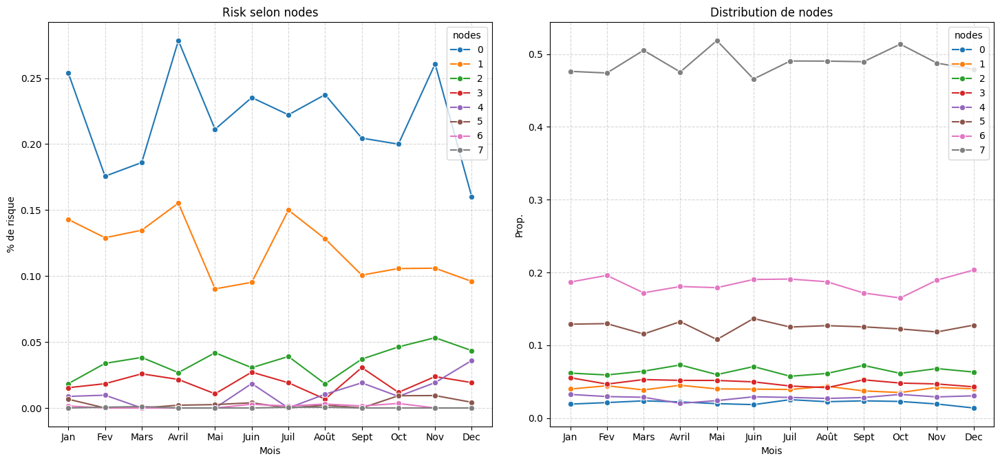

In [82]:
df_train_points["nodes"]=col_chr
df_train_points["month"]=df_train3["month"]
analyze_stability_grid(df_train_points, ["nodes"], 'cible')

In [83]:
mappings2 = [
    {"col": "nodes", "map": {3: 2, 4:2, 6:5}}
]

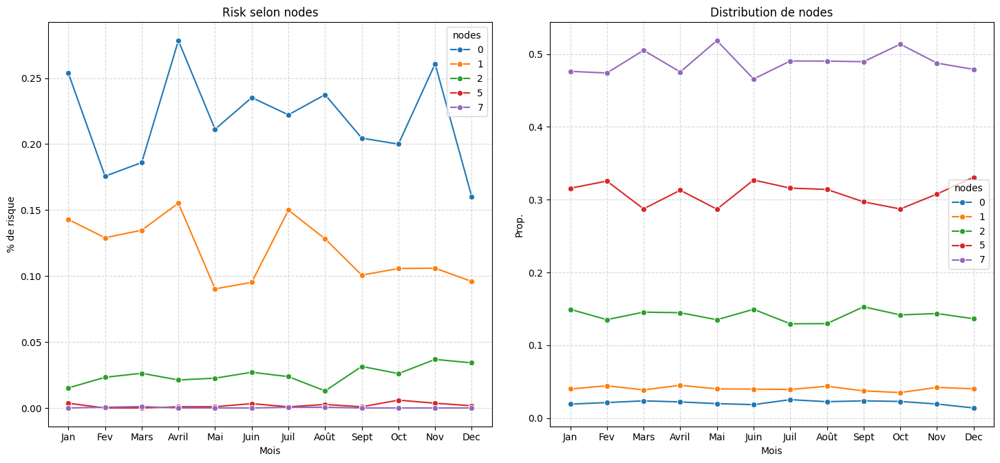

In [85]:
df_train_points_essai1=apply_mappings_and_recat(df_train_points, mappings2)
analyze_stability_grid(df_train_points_essai1, ["nodes"], 'cible')

In [87]:
mappings3 = [
    {"col": "nodes", "map": {7:5}}
]
df_train_points_essai2=apply_mappings_and_recat(df_train_points_essai1, mappings3)

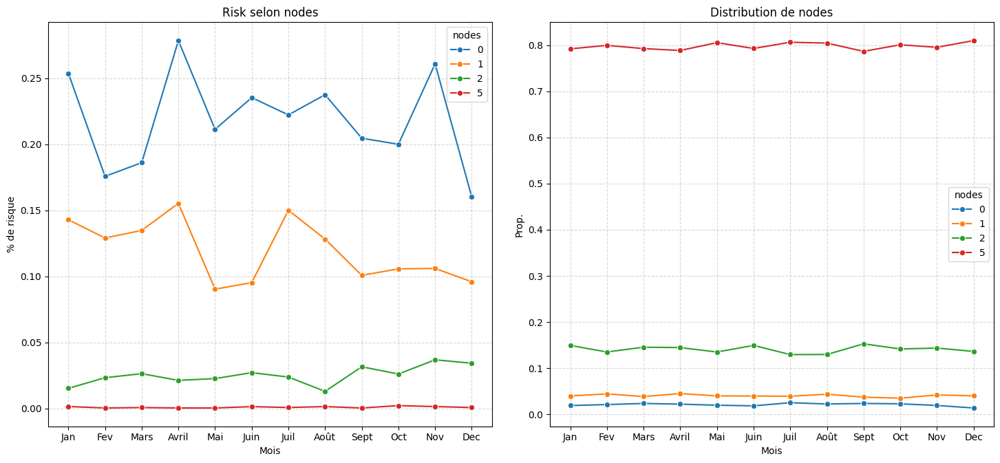

In [88]:
analyze_stability_grid(df_train_points_essai2, ["nodes"], 'cible')

In [ ]:
tx_par_node = (
    df_train_points_essai2
        .groupby("nodes", observed=True)["cible"]
        .mean()
        .reset_index()
        .rename(columns={"cible": "tx_chr"})
)
df_train_points_essai3 = df_train_points_essai2.merge(tx_par_node, on="nodes", how="left")

In [91]:
df_train_points_essai3

,crtad_ag_nbjde_bb,ind_dp_max,max_nbrjjr_ss_mm2_mm0,mntecsavo,nbrjjrdvtautcsc_stk,sldcrdmms_sum_mm5,score,cible,nodes,month,tx_chr
0,0,0,0,0,0,0,997,0,5,Sept,0.000928
1,0,0,0,0,0,0,997,0,5,Mars,0.000928
2,0,0,0,0,0,0,997,0,5,Juil,0.000928
3,1,0,0,0,1,1,793,0,5,Fev,0.000928
4,1,0,0,1,1,1,550,0,2,Mars,0.025246
...,...,...,...,...,...,...,...,...,...,...,...
43237,0,0,0,0,0,0,997,0,5,Sept,0.000928
43238,1,0,0,0,1,0,825,0,5,Mai,0.000928
43239,1,0,0,0,0,1,887,0,5,Mars,0.000928
43240,1,0,0,0,0,1,887,0,5,Jan,0.000928


In [ ]:
y_true = df_train_points_essai3["cible"].astype(int).values      
y_score = df_train_points_essai3["tx_chr"].astype(float).values  

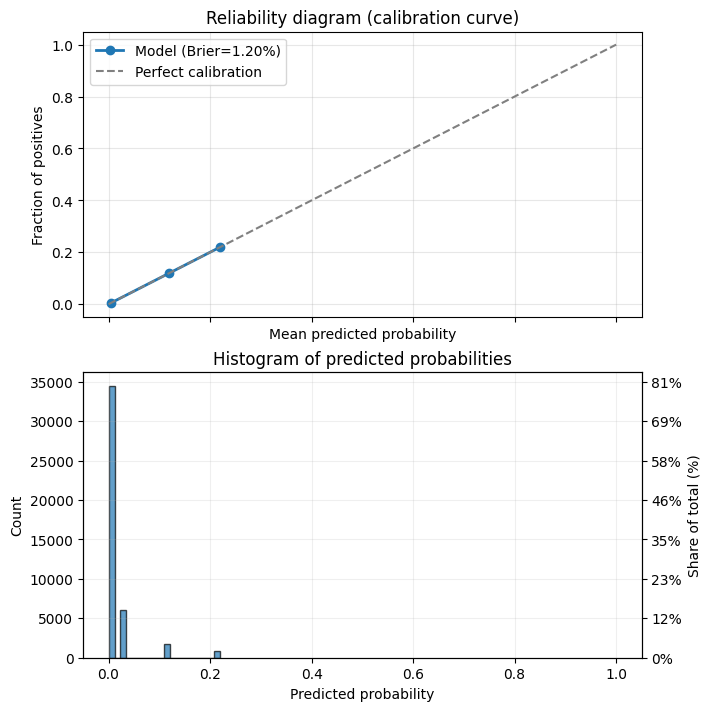

In [93]:
reliability_diagram(y_true, y_score, n_bins=20)

### Using a concurent model: XGBoost

In [102]:
liste_variables_qual=list(variables_qual_pre_finales["var"])
liste_variables_quant=variables_pre_finales_quant
cible="cible"

liste_finales_variables=liste_variables_qual+liste_variables_quant+[cible]

In [104]:
df_train_XGB=df_train[liste_finales_variables]
df_test_XGB=df_test[liste_finales_variables]

for var in liste_variables_qual:
    df_train_XGB.loc[:, var]=df_train_XGB[var].astype("category")
    df_test_XGB.loc[:, var]=df_train_XGB[var].astype("category")

In [106]:
X_train_XGB, y_train_XGB=df_train_XGB.drop('cible', axis=1), df_train_XGB.cible
X_test_XGB, y_test_XGB=df_test_XGB.drop('cible', axis=1), df_test_XGB.cible

In [ ]:
import xgboost as xgb
from sklearn.model_selection import GridSearchCV, StratifiedKFold

def train_and_predict(X_train, y_train, X_test, params, seuil=0.5):
    model = xgb.XGBClassifier(**params)
    model.fit(X_train, y_train)

    y_pred_proba_train = model.predict(X_train)
    y_pred_proba_test = model.predict(X_test)

    y_pred_train = (y_pred_proba_train >= seuil).astype(int)
    y_pred_test = (y_pred_proba_test >= seuil).astype(int)
    return model, y_pred_proba_train, y_pred_proba_test, y_pred_train, y_pred_test


def GridSearch_performed_classification(
        X_train, y_train, X_test,
        initial_learning_rate=0.1,
        initial_max_depth=5,
        initial_min_child_weight=10,
        early_stopping_rounds=20,
        num_boost_round=1000,
        max_depth_list=[3, 5, 7, 9],
        min_child_weight_list=[1, 3, 5, 7, 9, 11, 12, 13, 14],
        min_for_gamma=0,
        max_for_gamma=10,
        reg_alpha=[0, 0.01, 0.1, 1, 10, 100],
        reg_lambda=[0, 0.1, 0.5, 1, 5, 10, 50, 100],
        learning_rate=[0.01, 0.05, 0.1, 0.2, 0.3]
    ):

    # CV classique (classification)
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # STEP 1: Modèle initial
    initial_model = xgb.XGBClassifier(
        booster="gbtree",
        learning_rate=initial_learning_rate,
        n_estimators=1000,
        objective="binary:logistic",
        eval_metric="logloss",
        tree_method="hist",
        enable_categorical=True,
        max_depth=initial_max_depth,
        min_child_weight=initial_min_child_weight,
        random_state=42,
        n_jobs=-1,
        verbosity=0
    )

    # STEP 2: Optimisation de n_estimators via xgb.cv
    xgb_param = initial_model.get_xgb_params()
    #xgtrain = xgb.DMatrix(X_train.values, label=y_train.values)

    cvresult = xgb.cv(
        params=xgb_param,
        dtrain=X_train,
        num_boost_round=num_boost_round,
        nfold=5,
        metrics="logloss",
        early_stopping_rounds=early_stopping_rounds,
        seed=42
    )

    initial_model.set_params(n_estimators=cvresult.shape[0])

    # STEP 3: Optimisation max_depth & min_child_weight
    param_test1 = {
        "max_depth": max_depth_list,
        "min_child_weight": min_child_weight_list
    }

    gsearch1 = GridSearchCV(
        estimator=initial_model,
        param_grid=param_test1,
        scoring="neg_log_loss",
        n_jobs=-1,
        cv=cv
    )
    gsearch1.fit(X_train, y_train)

    best_max_depth = gsearch1.best_params_["max_depth"]
    best_min_child_weight = gsearch1.best_params_["min_child_weight"]

    # STEP 3b: Raffinement local
    param_test2 = {
        "max_depth": [best_max_depth - 1, best_max_depth, best_max_depth + 1],
        "min_child_weight": [
            max(1, best_min_child_weight - 2),
            best_min_child_weight,
            best_min_child_weight + 2
        ]
    }

    gsearch2 = GridSearchCV(
        initial_model,
        param_test2,
        scoring="neg_log_loss",
        n_jobs=-1,
        cv=cv
    )
    gsearch2.fit(X_train, y_train)

    # STEP 4: Optimisation gamma
    param_test3 = {
        "gamma": [round(i * 0.1, 1) for i in range(min_for_gamma, max_for_gamma)]
    }

    gsearch3 = GridSearchCV(
        initial_model.set_params(**gsearch2.best_params_),
        param_test3,
        scoring="neg_log_loss",
        n_jobs=-1,
        cv=cv
    )
    gsearch3.fit(X_train, y_train)

    # STEP 5: Re-optimisation n_estimators
    final_model = initial_model.set_params(**gsearch3.best_params_)

    xgb_param_final = final_model.get_xgb_params()
    cvresult_final = xgb.cv(
        params=xgb_param_final,
        dtrain=xgtrain,
        num_boost_round=num_boost_round,
        nfold=5,
        metrics="logloss",
        early_stopping_rounds=early_stopping_rounds,
        seed=42
    )

    final_model.set_params(n_estimators=cvresult_final.shape[0])

    # STEP 6: Régularisation
    param_test4 = {
        "reg_alpha": reg_alpha,
        "reg_lambda": reg_lambda
    }

    gsearch4 = GridSearchCV(
        final_model,
        param_test4,
        scoring="neg_log_loss",
        n_jobs=-1,
        cv=cv
    )
    gsearch4.fit(X_train, y_train)

    # STEP 7: Learning rate final
    param_test5 = {"learning_rate": learning_rate}

    final_best = final_model.set_params(**gsearch4.best_params_)
    gsearch5 = GridSearchCV(
        final_best,
        param_test5,
        scoring="neg_log_loss",
        n_jobs=-1,
        cv=cv
    )
    gsearch5.fit(X_train, y_train)

    final_best.set_params(**gsearch5.best_params_)

    best_params = final_best.get_params()

    return train_and_predict(X_train, y_train, X_test, best_params)

In [108]:
model_XGB, y_pred_proba_train_XGB, y_pred_proba_test_XGB, _, y_pred_test_XGB=GridSearch_performed_classification(X_train_XGB, y_train_XGB, X_test_XGB)

In [109]:
def metrics_for_model_XGB(y_true, y_pred_prob, y_pred):
    # AUC ROC
    auc_roc_plot(y_true, y_pred_prob)
    #4️⃣ Calcul des métriques
    print("✅ Accuracy :", accuracy_score(y_true, y_pred))
    print("✅ Confusion matrix :\n", confusion_matrix(y_true, y_pred))
    print("\n✅ Rapport de classification :\n", classification_report(y_true, y_pred))
    ##AUC PR
    auc_pr_plot(y_true, y_pred_prob)
    #Score de brier
    reliability_diagram(y_true, y_pred_prob)

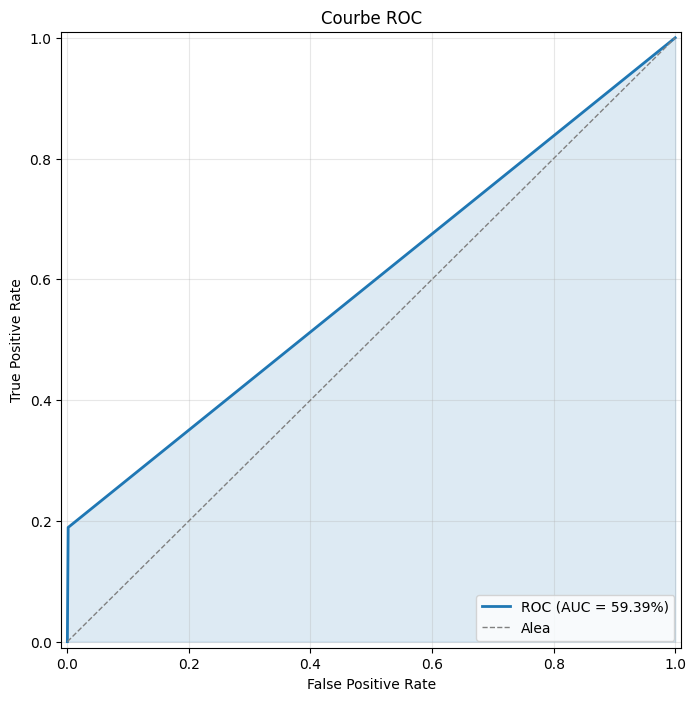

✅ Accuracy : 0.9876052169087041
✅ Confusion matrix :
 [[10649    14]
 [  120    28]]

✅ Rapport de classification :
               precision    recall  f1-score   support

           0       0.99      1.00      0.99     10663
           1       0.67      0.19      0.29       148

    accuracy                           0.99     10811
   macro avg       0.83      0.59      0.64     10811
weighted avg       0.98      0.99      0.98     10811



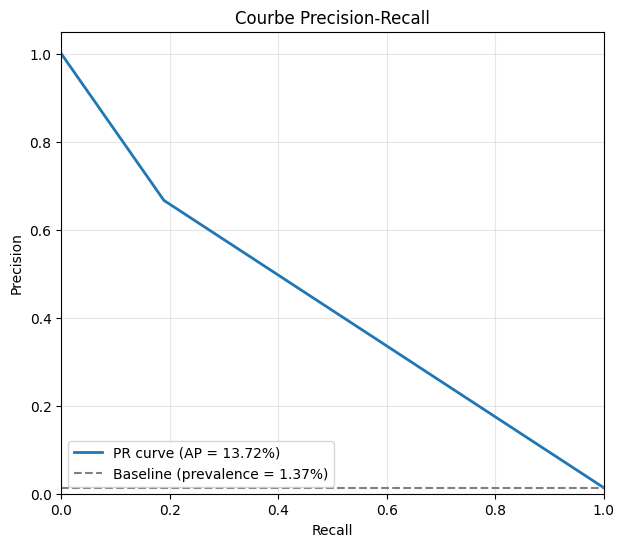

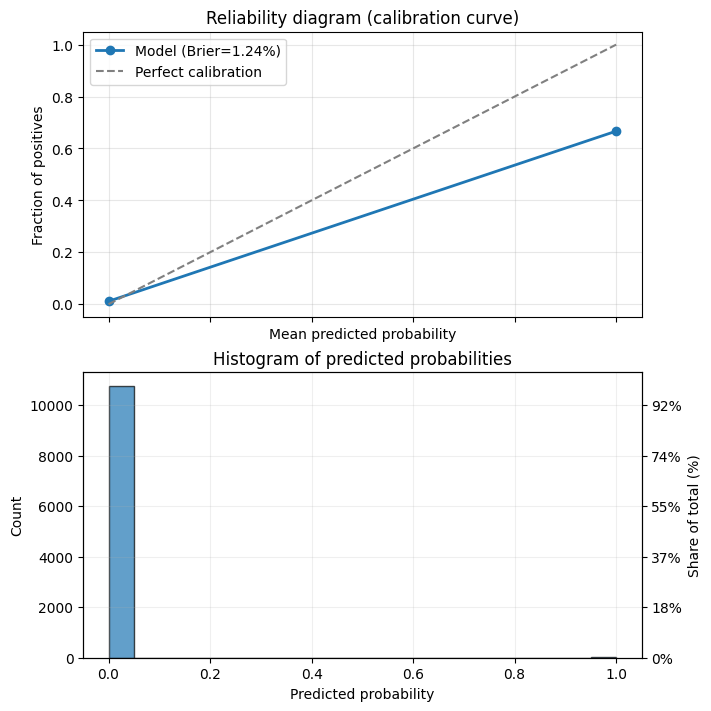

In [95]:
metrics_for_model_XGB(y_test_XGB, y_pred_proba_test_XGB, y_pred_test_XGB )

In [111]:
model_without_fine_tuning= xgb.XGBClassifier(
        booster="gbtree",
        objective="binary:logistic",
        eval_metric="logloss",
        n_estimators=200,
        learning_rate=0.1,
        max_depth=6,
        subsample=0.8,
        colsample_bytree=0.8,
        enable_categorical=True,
        random_state=42,
        n_jobs=-1
    )
model_without_fine_tuning.fit(X_train_XGB, y_train_XGB)

XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, device=None, early_stopping_rounds=None,
              enable_categorical=True, eval_metric='logloss',
              feature_types=None, feature_weights=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=200, n_jobs=-1,
              num_parallel_tree=None, ...)

In [112]:
y_pred_proba_test_XGB_without_fine_tuning = model_without_fine_tuning.predict(X_test_XGB)
y_pred_test_XGB_without_fine_tuning = (y_pred_proba_test_XGB_without_fine_tuning >= 0.5).astype(int)

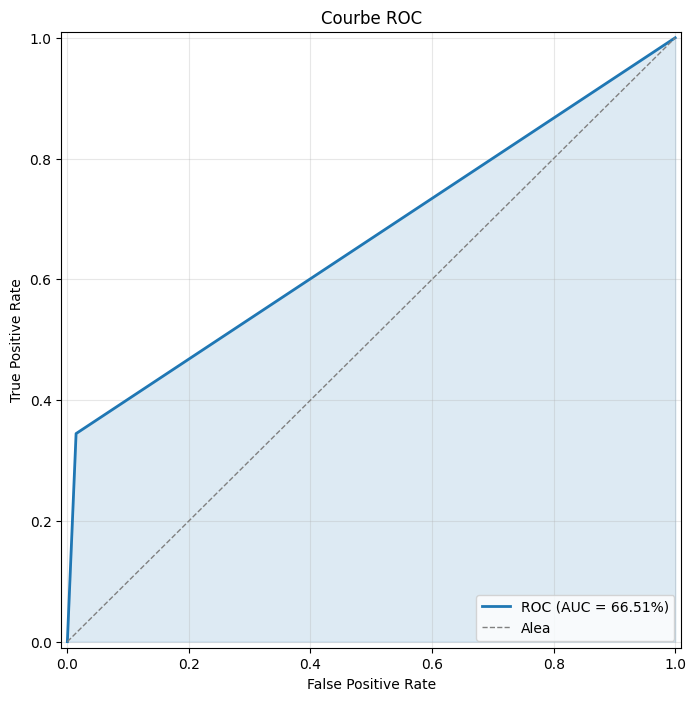

✅ Accuracy : 0.9768754046804181
✅ Confusion matrix :
 [[10510   153]
 [   97    51]]

✅ Rapport de classification :
               precision    recall  f1-score   support

           0       0.99      0.99      0.99     10663
           1       0.25      0.34      0.29       148

    accuracy                           0.98     10811
   macro avg       0.62      0.67      0.64     10811
weighted avg       0.98      0.98      0.98     10811



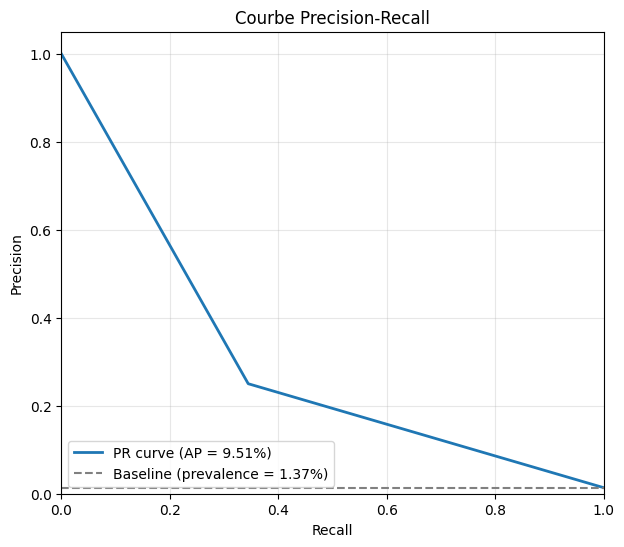

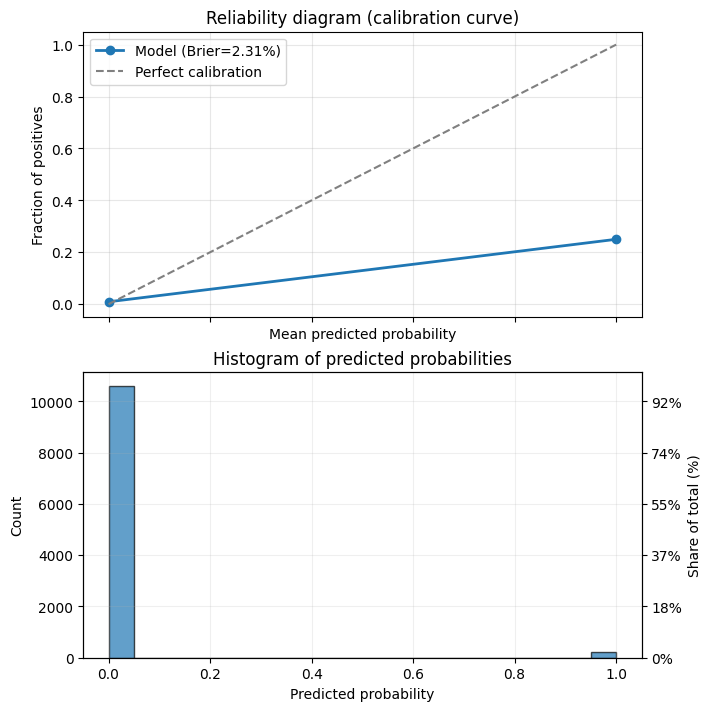

In [113]:
metrics_for_model_XGB(y_test_XGB, y_pred_proba_test_XGB_without_fine_tuning, y_pred_test_XGB_without_fine_tuning)